We are going to use NILEARN to plot a bunch of brain images. Let's create a mental model of what we are doing.

Pretty much everything we want to work with is a volumetric image file in the NIfTI (Neuroimaging Informatics Technology Initiative) format usually with extension .nii or .nii.gz. We use this format not just for brain images, but also for labels, masks etc, but let's step back a second.

When you image a brain with an MRI scanner you get a 3D array of voxels (little cubes) with intensity values. Imagine a large cuboid full of smaller cubes, each containing a number.

For a real MRI scan each cube isn't floating in abstract array land. Each voxel corresponds to a location in actual physical space. Different scanners have different: voxel sizes, orientations, coordinate origins, slice directions, and patient positioning. So NIfTI needs to store: (i) the voxel data, and (ii) how to interpret the voxel data in physical space in real-world millimetres. To store a single MRI in a NIfTI image we'll typically have:

1. A header containing:
    a. The dimensions of the voxel grid (X,Y,Z) for example 182 x 182 x 182
    b. Voxel size in mm for each dimension, for example 1mm x 1mm x 1mm
    c. Scale, rotation, and translation (affine transformation) to orient the image in a known frame of reference
2. The 3D block of voxel intensity data itself

This allows software to interpret the voxel data and plot it in 3D realistically. Note that scale is stored redundantly in the header as both a voxel size array and in the affine transformation as scale for historical reasons.

Now since every MRI scan has a slightly different scaling, rotation, translation, resolution etc this isn't particularly useful if we want to compare brain images, even if we can represent them as valid NIfTI files.

For this reason the neuroimaging community has standardised coordinate systems so that everyone can produce images that line up with each other. This allows us to overlay images with labels or masks, and compare images directly.

The canonical coordinate system has the abbreviation MNI (Montreal Neurological Institute) from whence it came. This is bundled with a brain image in that coordinate system to provide a base brain image and we call this a template.

The canonical template is called MNI152 and is a composite of 152 MRIs of different brains that have been transformed and warped to overlay each other and then the intensities are averaged. This gives a template which is a kind of "average brain" in the MNI coordinate space.

Now you'll be able to undersand exactly what I'm doing below:


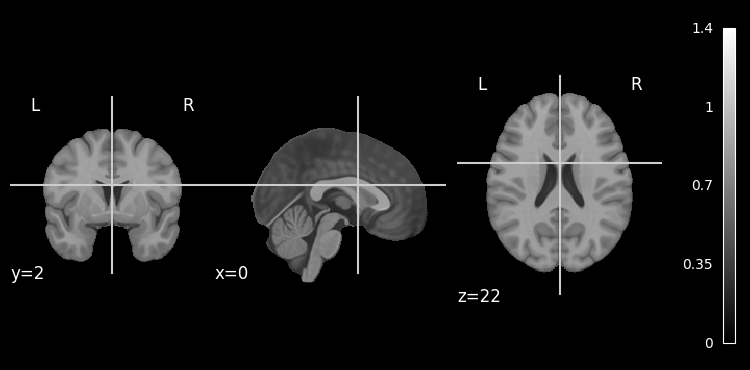

In [1]:
# the warnings wind me up
import warnings
warnings.filterwarnings('ignore')

# load in the required libraries from nilearn
from nilearn import datasets, plotting

# load the MNI 152 template
mni = datasets.load_mni152_template()

# plot it using the builtin function
plotting.plot_anat(mni)

That plots a static image of our template. We can also generate an interactive plot by using `plotting.view_img`. Note that `plotting.view_img` is designed to plot an overlay on top of a base image, so you'll see that there is a `bg_img` paramater which we'll set to `None`, but typically we'd actually set that to the MNI image or whatever we want our background image to be. That's why there is an odd colormap below:


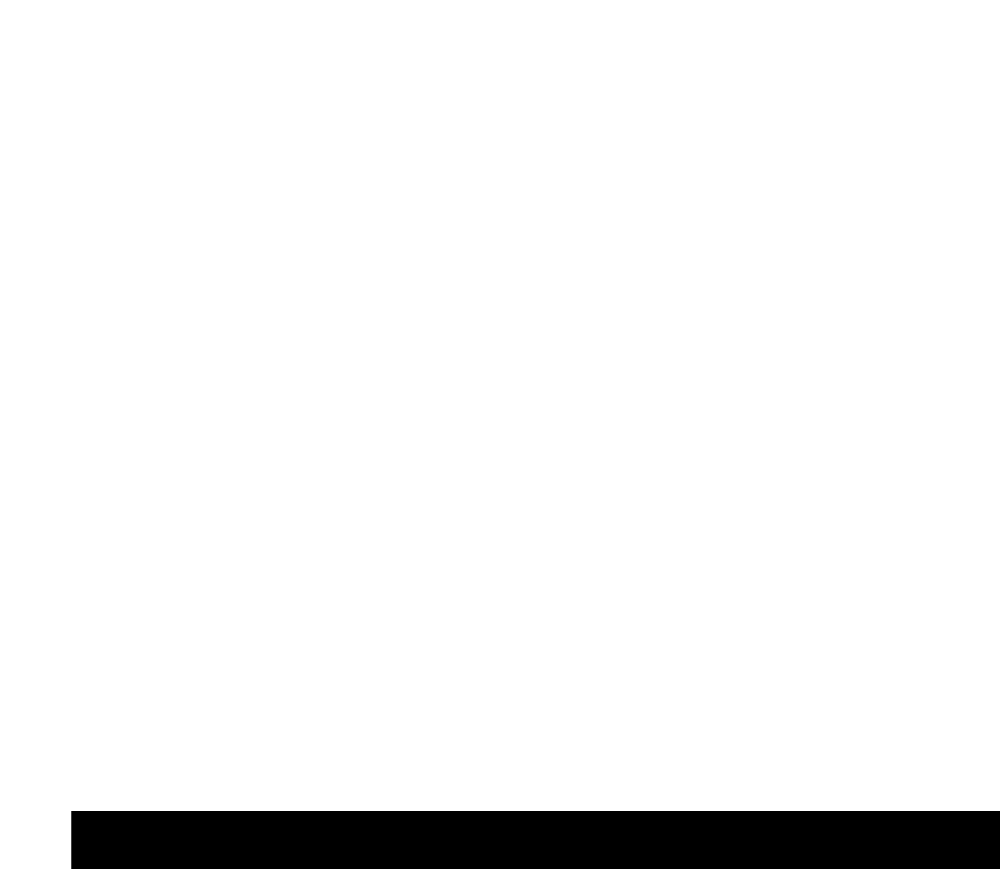
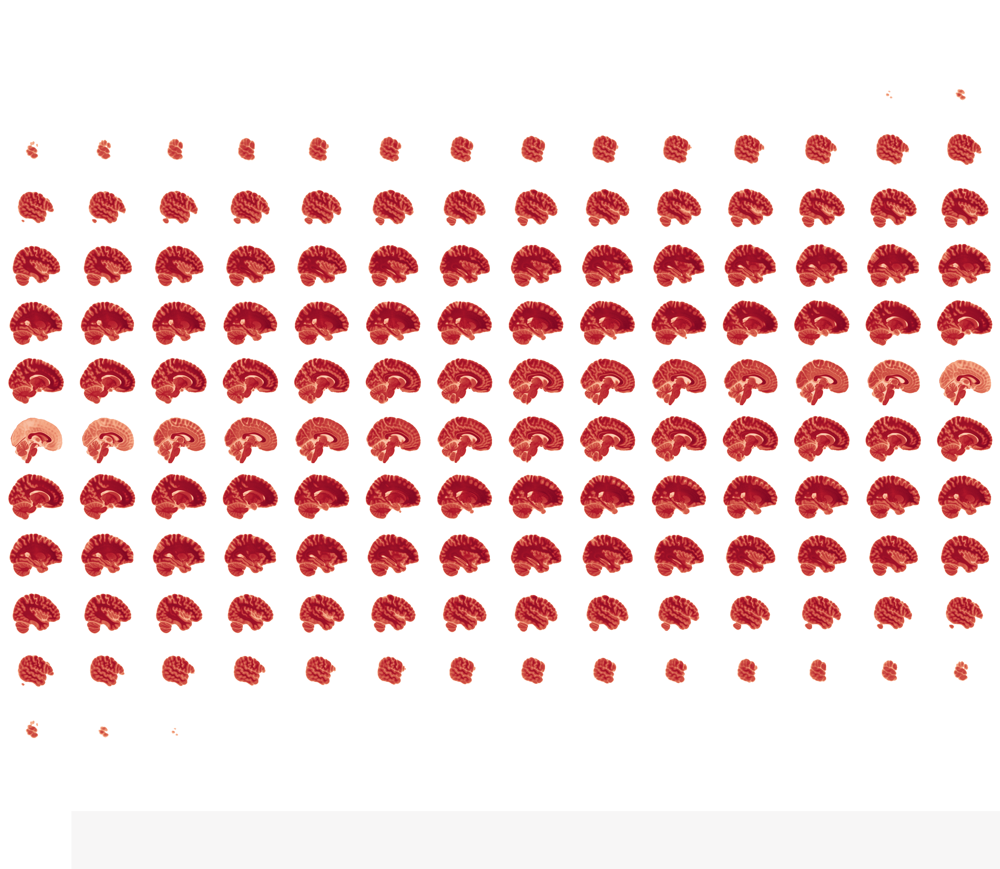

In [2]:
plotting.view_img(mni,bg_img=None,colorbar=None,width_view=800)

The MNI152 template is a floating brain, if you want one with a skull too then the SPM (Statistical Parametric Mapping) ICBM152 Nonlinear Asymmetric 2009c template has the skull:

[fetch_icbm152_2009] Dataset found in /home/ash/nilearn_data/icbm152_2009


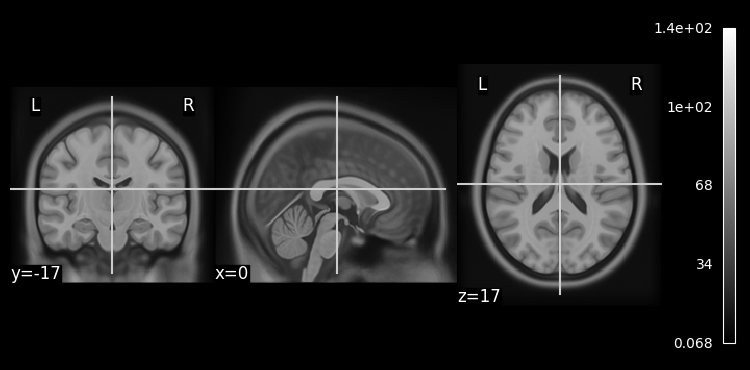

In [3]:
mni_spm = datasets.fetch_icbm152_2009()['t1']
plotting.plot_anat(mni_spm)

Generally we want to plot something on top of the brain template in order to, for example, highlight a specific brain area. We can accomplish this with a brain atlas and a mask.

A brain atlas, like its namesake, provides labels for brain features in the same way that a geographical atlas provides labels for parts of the world.

An atlas is just a special type of NIfTI image but instead of intensity values, each voxel is labelled with the feature name. Atlases come in two basic flavours: a 3D array (X,Y,Z) where each voxel value is one feature from a list of features (strictly speaking its the feature index and we lookup the label), and a 4D array (X,Y,Z,F) where for each voxel there is a vector of probabilities F containing the likelihood that each feature is present in location (X,Y,Z).

Sometimes an atlas is bundled with the template it corresponds to, others are not bundled but in both cases we can only use an atlas in the same coordinate system as the template. Let's make this concrete, we will load the AAL = Automated Anatomical Labeling atlas, this divides the brain into 116 regions (90 cortical + 26 cerebellar) each assigned a numeric label and a name like: 1 → Precentral_L

Let's load the atlas and show the mapping between labels and indices:

In [4]:
# AAL = Automated Anatomical Labeling atlas
atlas = datasets.fetch_atlas_aal()

[fetch_atlas_aal] Dataset found in /home/ash/nilearn_data/aal_SPM12


In [5]:
atlas.labels[0:5]

['Background',
 'Precentral_L',
 'Precentral_R',
 'Frontal_Sup_L',
 'Frontal_Sup_R']

In [6]:
atlas.indices[0:5]

['0', '2001', '2002', '2101', '2102']

Now if we get the atlas data voxel mapping we will see that it's a bunch of these indices. Note we have to load it as a NIfTI image:

In [7]:
from nilearn import image
print(atlas.maps)
atlas_img = image.load_img(atlas.maps)

/home/ash/nilearn_data/aal_SPM12/aal/atlas/AAL.nii


In [8]:
# here's the affine transformation for the raw voxels
atlas_img.affine

array([[  -2.,    0.,    0.,   90.],
       [   0.,    2.,    0., -126.],
       [   0.,    0.,    2.,  -72.],
       [   0.,    0.,    0.,    1.]])

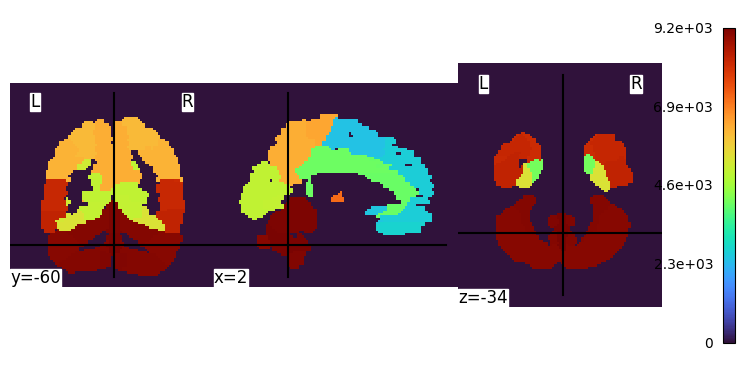

In [9]:
# if we plot the image we'll see all the brain regions
# crudely but with no background image
plotting.plot_img(atlas_img,cmap="turbo")

We could plot this on top of our template but its a bit pointless plotting the whole thing:


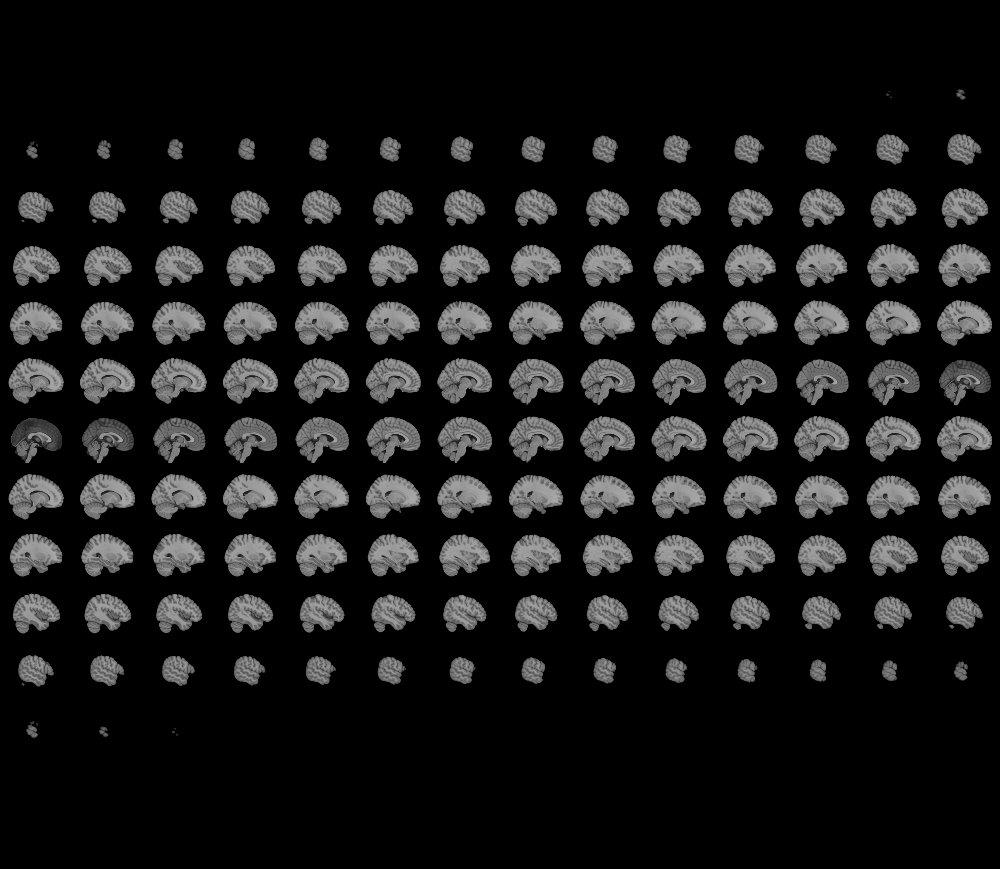
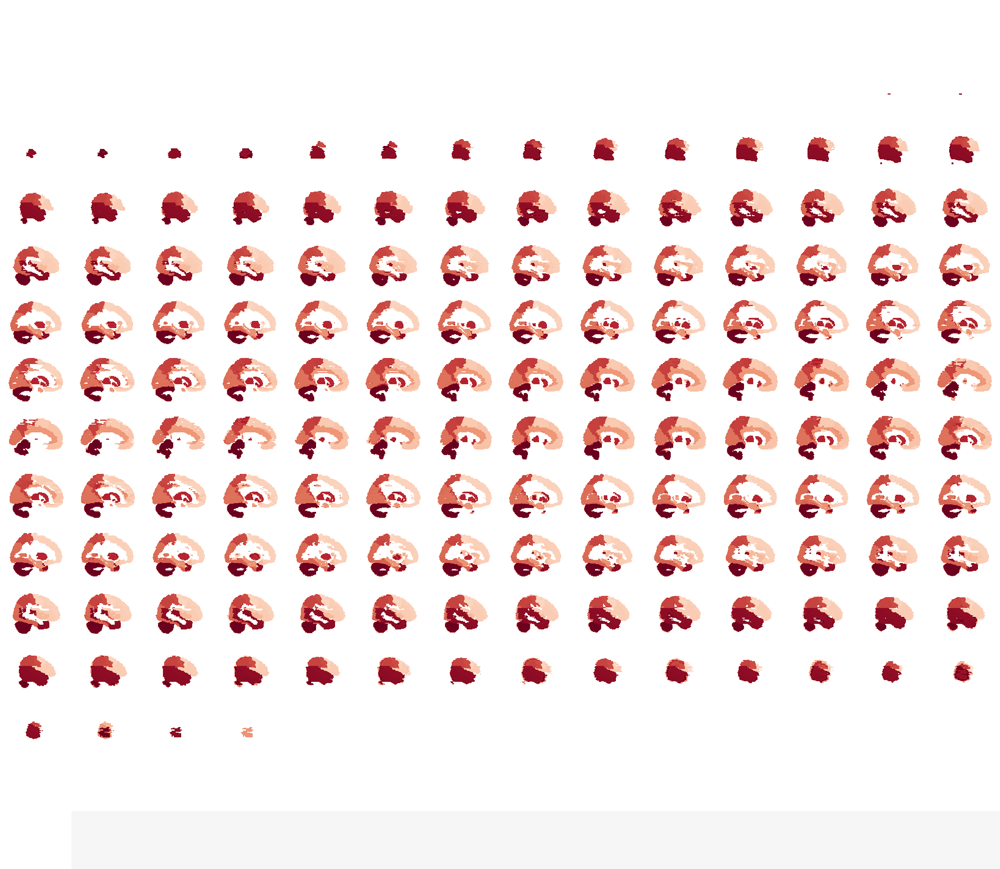

In [10]:
plotting.view_img(atlas_img,mni,opacity=0.5,colorbar=False,title="Entire atlas",width_view=800)

What we want to do is to select a specific region and plot that, to do that we need to construct a new overlay image by masking the atlas data according to the labels we want to show. The first thing we need to do is get the atlas data itself which contains the label indices:

In [11]:
# the actual data is retrieved using get_fdata which returns
# floats but we want integers for comparison with the label
# indices, the standard is to cast to numpy int32
import numpy as np
atlas_data = atlas_img.get_fdata().astype(np.int32)
print(atlas_data.shape)

(91, 109, 91)


Now we need the voxel values for our target label, let's say we want to look at Thalamus, there are two labels `Thalamus_L` and `Thalamus_R`; one for each hemisphere. So let's get the voxel values corresponding to those and construct a mask:

In [12]:
# get the raw indices from the labels that match the string "Thalamus"
idx = [i for i, label in enumerate(atlas.labels) if "Thalamus" in label]
print("Indices: ",idx)

# map these to voxel values, annoyingly the indices are strings
vals = np.array([int(atlas.indices[i]) for i in idx], dtype=np.int32)
print("Vals: ",vals)

# make a mask in the same shape as the atlas_data
mask = np.isin(atlas_data, vals)

# construct a new image from the atlas and the mask
thalamus_img = image.new_img_like(atlas_img, mask.astype(np.uint8))

Indices:  [77, 78]
Vals:  [7101 7102]


Now we can overlay just the part of the atlas that corresponds to the Thalamus on top of our brain template:


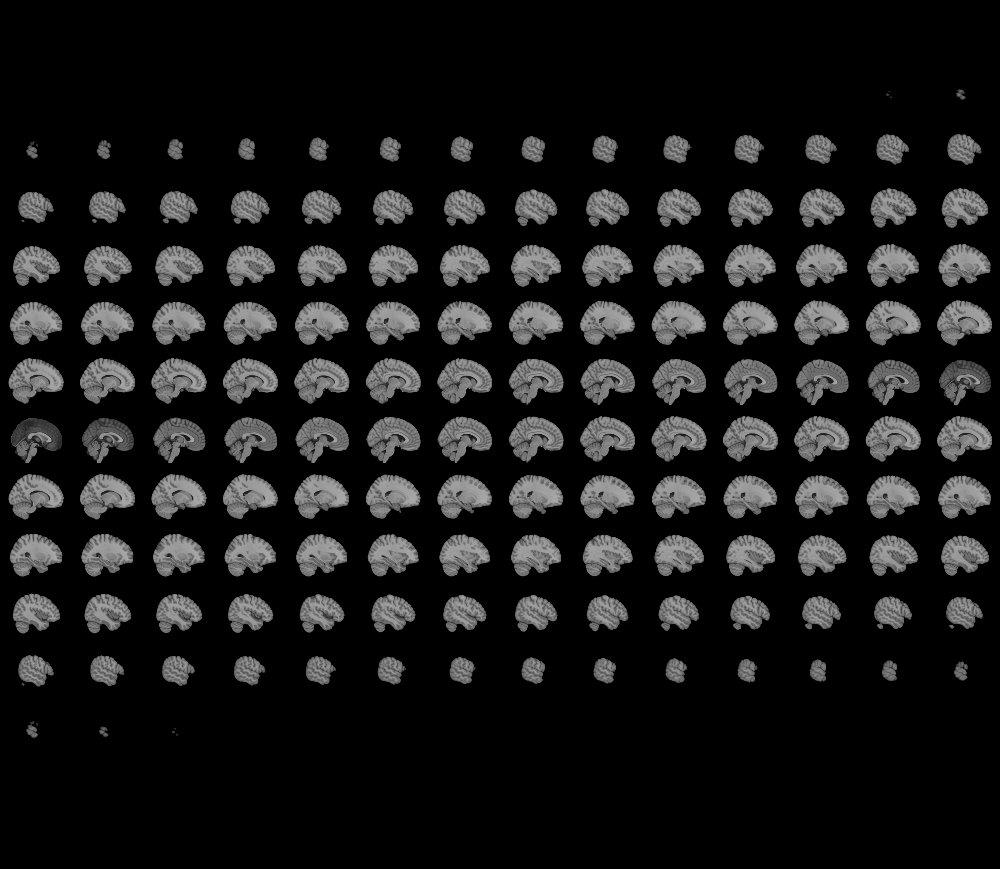
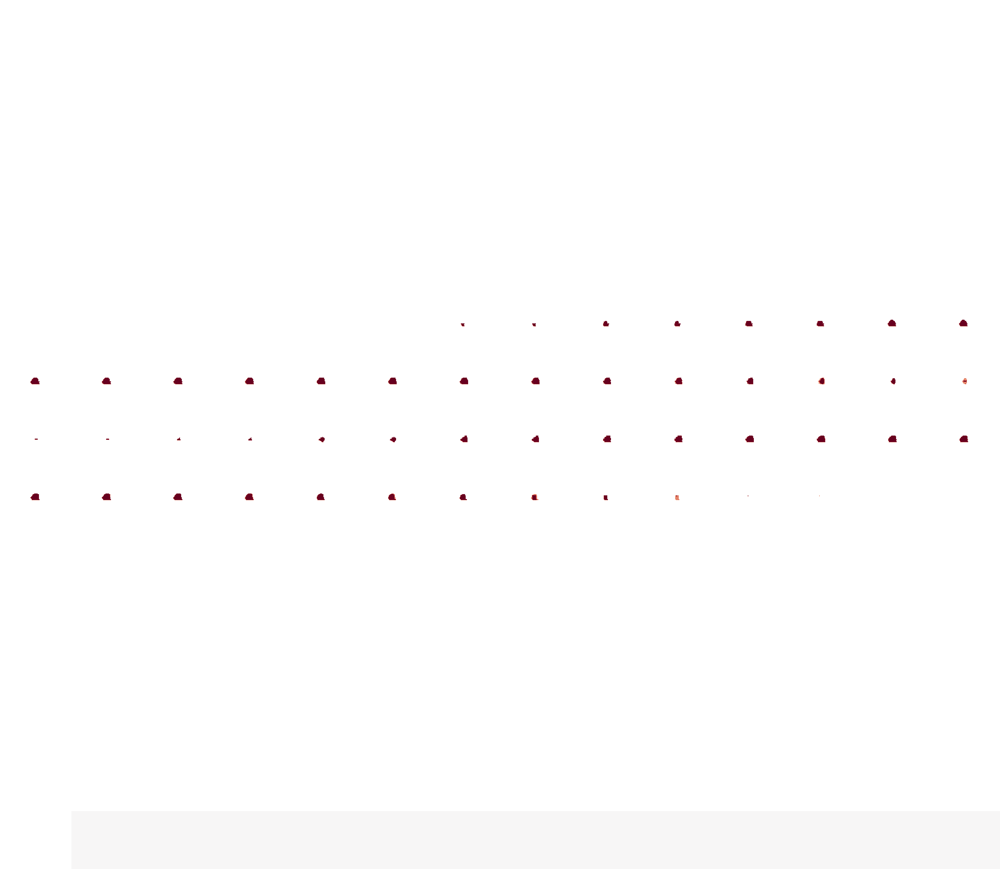

In [13]:
plotting.view_img(thalamus_img,mni,opacity=0.5,title="Thalamus",colorbar=False,width_view=800)

Hopefully that wasn't too painful. It seems a bit convoluted but all we did was:

1. Load in the template brain image voxels in the MNI coordinate system
2. Load in an "atlas" image for those voxels in the MNI coordinate system
3. Select the labels we want from the atlas (via their integer proxies)
4. Mask off the atlas according to the selected labels (Thalamus in our case)
5. Construct a new image based on the mask
6. Display the template brain image with the overlayed Thalamus mask